In [1]:
import pandas as pd
import numpy as np
import os
import regex as re
import matplotlib.pyplot as plt

In [2]:
AD_EEG_Data = pd.read_csv(os.path.join("EEG_human","ad_eeg_all.csv"))
Control_EEG_Data = pd.read_csv(os.path.join("EEG_human","control_eeg_all.csv"))
ftd_EEG_Data = pd.read_csv(os.path.join("EEG_human","ftd_eeg_all.csv"))

# Keep only first 300 seconds since thats is the duration of the shortest recording across all subjects (No NaN values).
T = 300
AD_EEG_Data = AD_EEG_Data[AD_EEG_Data['time'] <= T]
Control_EEG_Data = Control_EEG_Data[Control_EEG_Data['time'] <= T]
ftd_EEG_Data = ftd_EEG_Data[ftd_EEG_Data['time'] <= T]
Control_EEG_Data

,time,sub-037-Fp1,sub-037-Fp2,sub-037-F3,sub-038-Fp1,sub-038-Fp2,sub-038-F3,sub-039-Fp1,sub-039-Fp2,sub-039-F3,...,sub-062-F3,sub-063-Fp1,sub-063-Fp2,sub-063-F3,sub-064-Fp1,sub-064-Fp2,sub-064-F3,sub-065-Fp1,sub-065-Fp2,sub-065-F3
0,0.000,3.624606,3.079021,9.353775,24.834711,23.252020,24.904650,7.893659,9.236196,15.576571,...,12.933507,7.199648,9.411706,8.981445,9.489013,6.861579,0.516824,-10.472222,-8.496268,-16.394527
1,0.002,1.112700,1.395962,7.097532,23.571985,21.842621,23.831125,8.145528,8.065594,15.389544,...,13.149438,14.504241,16.565701,16.394173,8.091321,6.661284,-0.931474,-12.294664,-7.362644,-17.351988
2,0.004,-1.484552,0.040909,4.560909,22.012730,20.087461,22.382248,7.174129,5.637856,13.763612,...,13.439832,20.503918,22.461943,22.663898,6.170678,5.623942,-2.983070,-13.937010,-5.177046,-17.504206
3,0.006,-3.625714,-0.491458,2.249059,20.283073,18.107687,20.607409,5.077476,2.165846,10.807360,...,13.561347,24.511490,26.426693,27.079157,4.040508,3.954895,-5.211488,-15.391346,-2.184722,-16.949221
4,0.008,-4.829294,0.155530,0.662847,18.521498,16.049967,18.597950,2.171032,-1.944133,6.882742,...,13.292748,26.267662,28.201445,29.315735,2.058121,2.002540,-7.123408,-16.722275,1.219939,-15.944804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149996,299.992,-25.514244,-25.470707,-36.321568,23.445793,24.082586,31.997326,54.009399,47.142818,51.747555,...,13.335031,-16.093668,-18.136770,-12.918013,24.670578,30.571056,35.166264,-31.943905,-20.269791,-20.588976
149997,299.994,-24.930864,-25.958990,-36.740517,22.344254,22.674061,30.671045,56.200027,51.122105,57.873379,...,15.776994,-16.791788,-17.844370,-14.004007,24.130423,30.349222,36.821465,-29.547672,-18.915936,-19.080744
149998,299.996,-24.310507,-26.002411,-36.552597,21.384132,21.201790,29.070578,58.548279,55.382153,64.950470,...,18.044031,-16.860596,-17.050917,-15.034226,24.303070,30.307369,38.370026,-26.277966,-17.568296,-17.958153
149999,299.998,-23.830906,-25.657820,-35.807106,20.685534,19.882896,27.458761,61.096478,59.743568,71.937752,...,19.956680,-16.336576,-15.861935,-15.850633,25.316910,30.596235,39.909698,-22.686293,-16.452469,-17.443552


Preprocessing has already been done:

Only the derivatives folder, where the preprocessed data is kept, is covered by this section. The following is the EEG signals’ preprocessing pipeline. 

* The signals were **re-referenced to the average value of A1-A2** (reference electrodes placed on mastoids) after applying a **Butterworth band-pass filter with a frequency range of 0.5 to 45 Hz**. 
* The signals were then subjected to the **ASR routine, an automatic artifact reject technique that can eliminate persistent or large-amplitude artifacts, which removed bad data periods that exceeded the maximum acceptable 0.5 s window standard deviation of 17 (which is regarded as a conservative window)**. 
* **The ICA method (RunICA algorithm) was then used to convert the 19 EEG signals to 19 ICA components [19]**. ICA components categorized as “eye artifacts” or “jaw artifacts” by the EEGLAB platform’s automatic classification method “ICLabel” were automatically excluded. 

It should be mentioned that, even though the recording was done in a resting state with the eyes closed, eye movement artifacts were still identified in certain EEG recordings. Figure 2 represents a snapshot of the same signal in raw form, and in preprocessed form. It can be observed that severe high frequency artifacts have been removed and baseline correction has been applied.

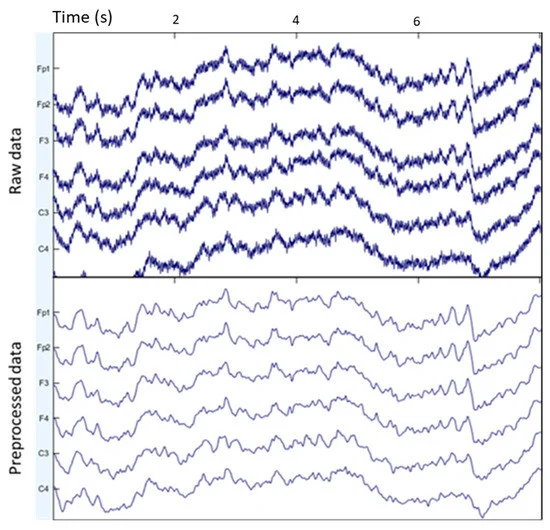

[Miltiadous, A., Tzimourta, K. D., Afrantou, T., Ioannidis, P., Grigoriadis, N., Tsalikakis, D. G., Angelidis, P., Tsipouras, M. G., Glavas, E., Giannakeas, N., & Tzallas, A. T. (2023). A Dataset of Scalp EEG Recordings of Alzheimer’s Disease, Frontotemporal Dementia and Healthy Subjects from Routine EEG. Data, 8(6), 95. https://doi.org/10.3390/data8060095](https://www.mdpi.com/2306-5729/8/6/95)

In [3]:
# Make nx3 plot
def vis_class_channel(df, group, y_lim=[]):
    channels = ['Fp1', 'Fp2', 'F3']
    temp_fig, temp_ax = plt.subplots(len(list(filter(lambda x: 'Fp1' in x, df.columns))), len(channels), figsize=(30, 60), sharex=True, sharey=True)
    for i in range(len(channels)):
        fp_cols = list(filter(lambda x: channels[i] in x, df.columns))
        temp_df = df[['time'] + fp_cols].dropna()
        for j in range(len(fp_cols)):
            sub = fp_cols[j]
            temp_ax[j][i].plot(temp_df['time'], temp_df[sub])
            temp_ax[j][i].set_xlabel('Time (s)')
            temp_ax[j][i].set_ylabel('Signal (µV)')
            temp_ax[j][i].set_title(sub)
            if y_lim:
                temp_ax[j][i].set_ylim(y_lim)
    temp_fig.suptitle(f'{channels[i]} channel for {group} group')    
    temp_fig.tight_layout(rect=[0, 0.03, 1, 0.98])


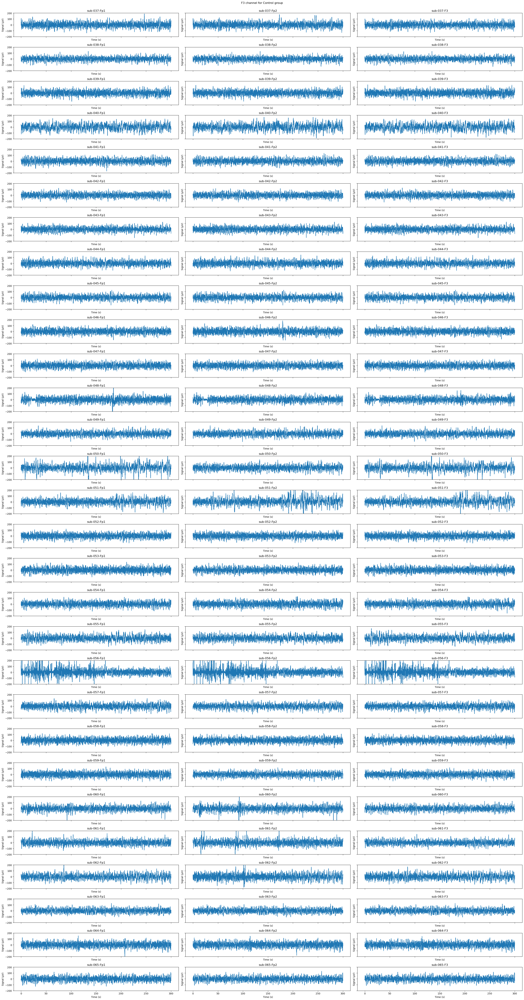

In [4]:
vis_class_channel(Control_EEG_Data, 'Control', [-200, 200])


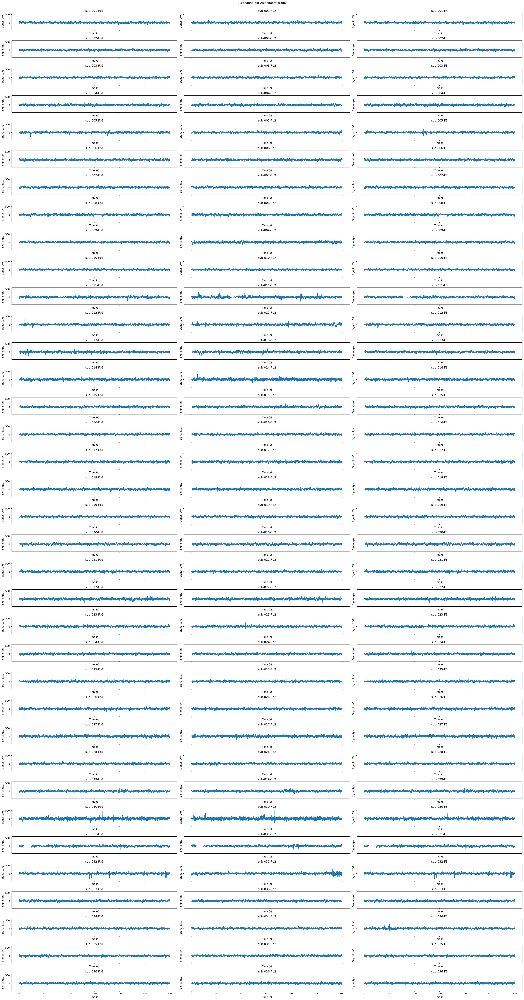

In [5]:
vis_class_channel(AD_EEG_Data, 'Alzheimers')


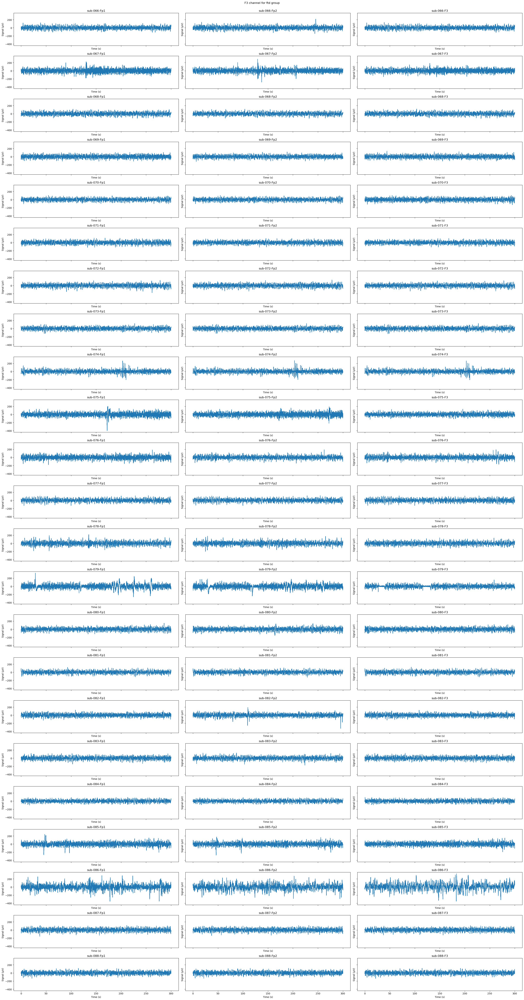

In [6]:
vis_class_channel(ftd_EEG_Data, 'ftd')


In [17]:
# Artifact filtering
def subject_filtering(df, out):
    subjects = list(set('-'.join(col.split('-')[:2]) for col in df.columns if col != "time"))
    # Identify all EEG channel names
    channels = list(set(col.split('-')[-1] for col in df.columns if col != "time"))
    # Dictionary to store per-subject variance for each channel
    subject_variances = {subj: {} for subj in subjects}

    # Compute variance per channel for each subject
    for subj in subjects:
        for chan in channels:
            col_name = f"{subj}-{chan}"
            if col_name in df.columns:
                subject_variances[subj][chan] = df[col_name].var()

    # Convert to DataFrame for easier analysis
    var_df = pd.DataFrame(subject_variances).T  # Subjects as rows, channels as columns

    # Compute the mean variance for each channel across all subjects
    #variance_threshold = var_df.mean()
    Q1 = var_df.quantile(0.25)
    Q3 = var_df.quantile(0.75)
    IQR = Q3 - Q1
    variance_threshold = Q3 + 1.5 * IQR

    # Identify subjects exceeding the mean variance in **any** channel
    high_variance_subjects = var_df[var_df > variance_threshold].dropna(how="all").index.tolist()

    print(f"Removing {len(high_variance_subjects)} subjects due to high variance: {high_variance_subjects}")

    # Remove high-variance subjects from the DataFrame
    filtered_columns = [col for col in df.columns if not any(subj in col for subj in high_variance_subjects)]
    df_clean = df[filtered_columns]
    df_clean.to_csv(out, index=False) 
    return df_clean

def outlier_imputation(df, out, threshold=200, window=1000):
    # Function to impute high-amplitude values with rolling median
    df_imputed = df.copy()
    total_imputed = 0
    # Ignore "time" column
    for col in df.columns:
        if col == "time":
            continue
        
        # Identify high-amplitude values
        high_amp_mask = df[col].abs() > threshold
        total_imputed += high_amp_mask.sum().sum()
        
        # Replace with rolling median
        df_imputed[col][high_amp_mask] = df[col].rolling(window=window, center=True, min_periods=1).mean()[high_amp_mask]
        
    print(f"Imputed {total_imputed} values due to artifacts.")

    df_imputed.to_csv(out, index=False) 

    return df_imputed


In [18]:
Control_EEG_Data_filtered = subject_filtering(Control_EEG_Data, os.path.join('EEG_human', 'control_eeg_all_filtered.csv'))
#AD_EEG_Data_filtered = subject_filtering(AD_EEG_Data, os.path.join('EEG_human', 'ad_eeg_all_filtered.csv'))
#ftd_EEG_Data_filtered = subject_filtering(ftd_EEG_Data, os.path.join('EEG_human', 'ftd_eeg_all_filtered.csv'))

Control_EEG_Data_filtered_imputed = outlier_imputation(Control_EEG_Data_filtered, os.path.join('EEG_human', 'control_eeg_all_filtered_imputed.csv'))
#AD_EEG_Data_filtered_imputed = outlier_imputation(AD_EEG_Data_filtered, os.path.join('EEG_human', 'ad_eeg_all_filtered_imputed.csv'))
#ftd_EEG_Data_filtered_imputed = outlier_imputation(ftd_EEG_Data_filtered, os.path.join('EEG_human', 'ftd_eeg_all_filtered_imputed.csv'))


Control_EEG_Data_filtered

Removing 7 subjects due to high variance: ['sub-056', 'sub-061', 'sub-055', 'sub-062', 'sub-040', 'sub-050', 'sub-051']
Imputed 293 values due to artifacts.


,time,sub-037-Fp1,sub-037-Fp2,sub-037-F3,sub-038-Fp1,sub-038-Fp2,sub-038-F3,sub-039-Fp1,sub-039-Fp2,sub-039-F3,...,sub-060-F3,sub-063-Fp1,sub-063-Fp2,sub-063-F3,sub-064-Fp1,sub-064-Fp2,sub-064-F3,sub-065-Fp1,sub-065-Fp2,sub-065-F3
0,0.000,3.624606,3.079021,9.353775,24.834711,23.252020,24.904650,7.893659,9.236196,15.576571,...,6.928782,7.199648,9.411706,8.981445,9.489013,6.861579,0.516824,-10.472222,-8.496268,-16.394527
1,0.002,1.112700,1.395962,7.097532,23.571985,21.842621,23.831125,8.145528,8.065594,15.389544,...,10.687888,14.504241,16.565701,16.394173,8.091321,6.661284,-0.931474,-12.294664,-7.362644,-17.351988
2,0.004,-1.484552,0.040909,4.560909,22.012730,20.087461,22.382248,7.174129,5.637856,13.763612,...,13.970142,20.503918,22.461943,22.663898,6.170678,5.623942,-2.983070,-13.937010,-5.177046,-17.504206
3,0.006,-3.625714,-0.491458,2.249059,20.283073,18.107687,20.607409,5.077476,2.165846,10.807360,...,16.448811,24.511490,26.426693,27.079157,4.040508,3.954895,-5.211488,-15.391346,-2.184722,-16.949221
4,0.008,-4.829294,0.155530,0.662847,18.521498,16.049967,18.597950,2.171032,-1.944133,6.882742,...,17.931343,26.267662,28.201445,29.315735,2.058121,2.002540,-7.123408,-16.722275,1.219939,-15.944804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149996,299.992,-25.514244,-25.470707,-36.321568,23.445793,24.082586,31.997326,54.009399,47.142818,51.747555,...,-8.436410,-16.093668,-18.136770,-12.918013,24.670578,30.571056,35.166264,-31.943905,-20.269791,-20.588976
149997,299.994,-24.930864,-25.958990,-36.740517,22.344254,22.674061,30.671045,56.200027,51.122105,57.873379,...,-6.849921,-16.791788,-17.844370,-14.004007,24.130423,30.349222,36.821465,-29.547672,-18.915936,-19.080744
149998,299.996,-24.310507,-26.002411,-36.552597,21.384132,21.201790,29.070578,58.548279,55.382153,64.950470,...,-5.397461,-16.860596,-17.050917,-15.034226,24.303070,30.307369,38.370026,-26.277966,-17.568296,-17.958153
149999,299.998,-23.830906,-25.657820,-35.807106,20.685534,19.882896,27.458761,61.096478,59.743568,71.937752,...,-4.094118,-16.336576,-15.861935,-15.850633,25.316910,30.596235,39.909698,-22.686293,-16.452469,-17.443552


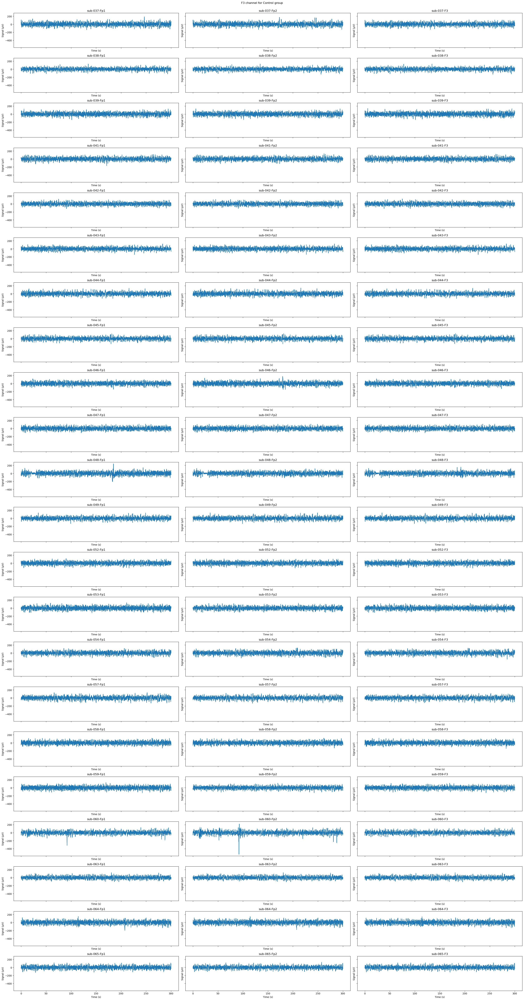

In [19]:
vis_class_channel(Control_EEG_Data_filtered, 'Control')


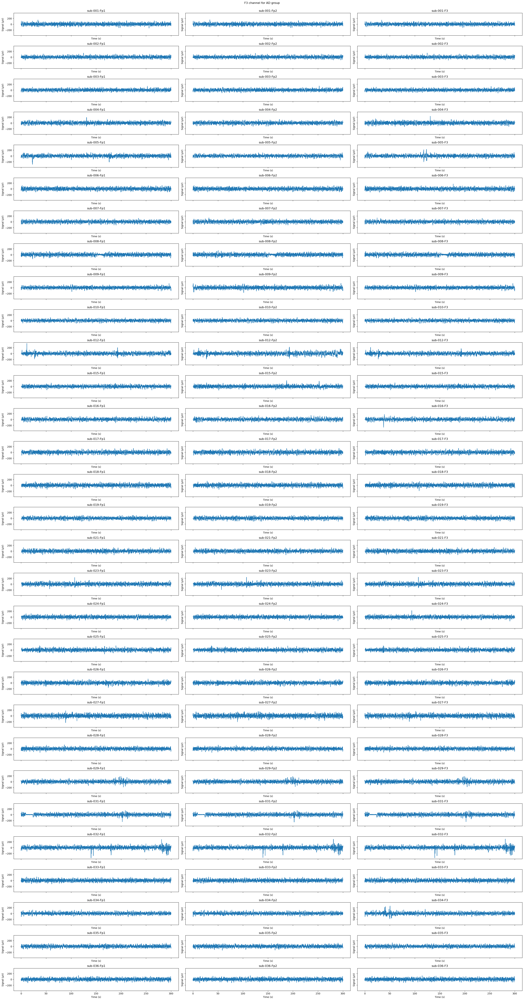

In [10]:
vis_class_channel(AD_EEG_Data_filtered, 'AD')


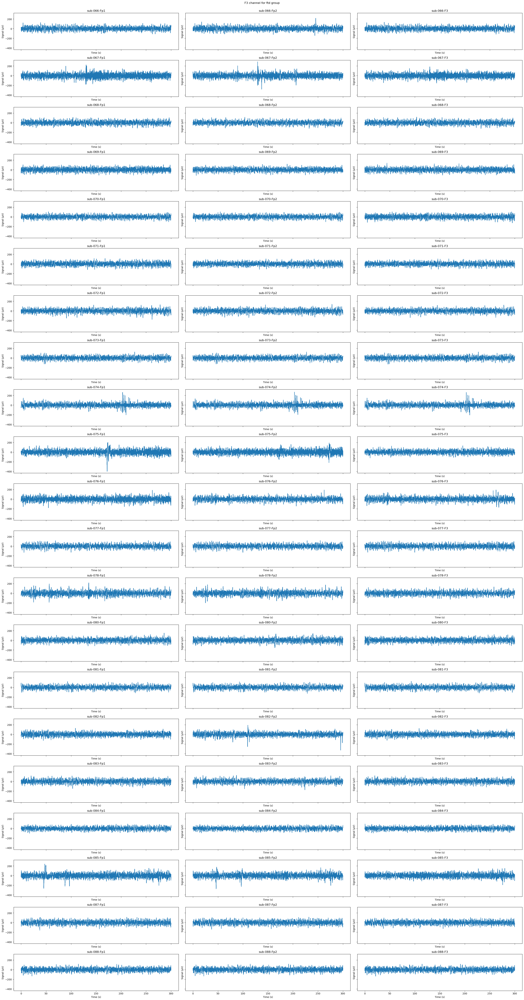

In [11]:
vis_class_channel(ftd_EEG_Data_filtered, 'ftd')
